
## Goal
In this project you will create a data pipeline that ingests wather warnings
 
Input:
https://alerts.weather.gov/cap/us.php?x=0
fips6 location codes to translate warining location into region, state and county
 
Create a bronze delta table to where every batch of data is appended
Create a silver delta table where waning data is merge
Create a gold delta table where warning location is enriched

The pipeline should both consider initial and incremental loads
 
Create some visuals (charts) to analyse the data :
Some examples:
- Counts by state, county, date, type of alert
- What alerts are currently active

### Dataflows
get alerts, get fips -> select and filters alerts -> marge datasets geocode

## Leitura dos dados em Weather Alerts

In [0]:
import requests
import datetime, time

url = "https://alerts.weather.gov/cap/us.php?x=0"
alerts_path="/FileStore/tables/weather"

# Fetch 
response = requests.get(url)
xml_data = response.content


def weather_alerts(url_to_download,path_to_write):
    
    data_xml = requests.get(url_to_download).content

    filename_to_write='weather_alerts-{date:%Y-%m-%d_%H:%M:%S}.txt'.format( date=datetime.datetime.now() )
    path_to_write=path_to_write+"/"+filename_to_write

    alerts_file = dbutils.fs.put(path_to_write, str(data_xml))

    return alerts_file

alerts_file = weather_alerts(url, alerts_path)


Wrote 2716956 bytes.


### XML para Dataframe Spark

In [0]:
from pyspark.sql.functions import *
from pyspark.sql.types import *

df_alerts = spark.read.option("rowTag", "entry").format("xml").load(alerts_path)


In [0]:
display(df_alerts)

_VALUE,author,cap:areaDesc,cap:category,cap:certainty,cap:effective,cap:event,cap:expires,cap:geocode,cap:msgType,cap:onset,cap:parameter,cap:polygon,cap:sent,cap:severity,cap:status,cap:urgency,id,link,published,summary,title,updated
"List(\n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n)","List(List(\n, \n), NWS)","Allegan, MI",Met,Observed,2024-07-08T20:22:00Z,Severe Thunderstorm Warning,2024-07-08T20:45:00Z,"List(List(List(\n, \n, \n), 026005, SAME), List(List(\n, \n, \n), MIC005, UGC))",Update,2024-07-08T20:22:00Z,"List(List(List(\n, \n, \n), SVSGRR, AWIPSidentifier), List(List(\n, \n, \n), WWUS53 KGRR 082022, WMOidentifier), List(List(\n, \n, \n), A SEVERE THUNDERSTORM WARNING REMAINS IN EFFECT UNTIL 445 PM EDT FOR EASTERN ALLEGAN COUNTY, NWSheadline), List(List(\n, \n, \n), 2024-07-08T20:21:00-00:00...storm...216DEG...24KT...42.54,-85.85, eventMotionDescription), List(List(\n, \n, \n), RADAR INDICATED, windThreat), List(List(\n, \n, \n), 60 MPH, maxWindGust), List(List(\n, \n, \n), RADAR INDICATED, hailThreat), List(List(\n, \n, \n), 0.75, maxHailSize), List(List(\n, \n, \n), EAS, BLOCKCHANNEL), List(List(\n, \n, \n), NWEM, BLOCKCHANNEL), List(List(\n, \n, \n), CMAS, BLOCKCHANNEL), List(List(\n, \n, \n), WXR, EAS-ORG), List(List(\n, \n, \n), /O.CON.KGRR.SV.W.0064.000000T0000Z-240708T2045Z/, VTEC), List(List(\n, \n, \n), 2024-07-08T20:45:00+00:00, eventEndingTime))","42.62,-85.61 42.45,-85.8199999 42.52,-85.9599999 42.75,-85.79 42.62,-85.61",2024-07-08T20:22:00Z,Severe,Actual,Immediate,https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.b9b24c6a5bf4fbc95cc903f9990ce6072b068214.001.1,"List(https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.b9b24c6a5bf4fbc95cc903f9990ce6072b068214.001.1.cap, alternate)",2024-07-08T20:22:00Z,"At 421 PM EDT, a severe thunderstorm was located over Allegan, moving\nnortheast at 30 mph.\n\nHAZARD...60 mph wind gusts and penny size hail.\n\nSOURCE...Radar indicated.\n\nIMPACT...Expect damage to roofs, siding, and trees.\n\nLocations impacted include...\nAllegan... Hopkins... Bradley...",Severe Thunderstorm Warning issued July 8 at 4:22PM EDT until July 8 at 4:45PM EDT by NWS Grand Rapids MI,2024-07-08T20:22:00Z
"List(\n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n)","List(List(\n, \n), NWS)",Dunn; Chippewa,Met,Observed,2024-07-08T20:22:00Z,Special Weather Statement,2024-07-08T20:45:00Z,"List(List(List(\n, \n, \n), 055033, SAME), List(List(\n, \n, \n), 055017, SAME), List(List(\n, \n, \n), WIZ025, UGC), List(List(\n, \n, \n), WIZ027, UGC))",Alert,2024-07-08T20:22:00Z,"List(List(List(\n, \n, \n), SPSMPX, AWIPSidentifier), List(List(\n, \n, \n), WWUS83 KMPX 082022, WMOidentifier), List(List(\n, \n, \n), A STRONG THUNDERSTORM WILL IMPACT NORTHEASTERN DUNN AND WEST CENTRAL CHIPPEWA COUNTIES THROUGH 345 PM CDT, NWSheadline), List(List(\n, \n, \n), 2024-07-08T20:22:00-00:00...storm...249DEG...15KT...45.07,-91.77, eventMotionDescription), List(List(\n, \n, \n), Up to 30 MPH, maxWindGust), List(List(\n, \n, \n), 0.50, maxHailSize), List(List(\n, \n, \n), EAS, BLOCKCHANNEL), List(List(\n, \n, \n), NWEM, BLOCKCHANNEL), List(List(\n, \n, \n), CMAS, BLOCKCHANNEL), List(List(\n, \n, \n), WXR, EAS-ORG))","45.03,-91.81 45.1,-91.85 45.17,-91.65 45.05,-91.58 45.03,-91.81",2024-07-08T20:22:00Z,Moderate,Actual,Expected,https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1,"List(https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1.cap, alternate)",2024-07-08T20:22:00Z,"At 322 PM CDT, trained weather spotters reported a strong\nthunderstorm near Colfax, or 13 miles northeast of Menomonie, moving\neast at 15 mph.\n\nHAZARD...Half inch hail and heavy rainfall.\n\nSOURCE...Trained weather spotters.\n\nIMPACT...Minor hail damage to veget

## Tabela FIP

In [0]:
## Dados FIPs
from io import StringIO
import pandas as pd

def fetch_and_process_fips_csv(url):
    # Requisição HTTP
    response = requests.get(url)
    
    # Ler o conteúdo da resposta como um DataFrame
    df = pd.read_csv(StringIO(response.text))
    
    # Adicionar um zero a todas as entradas FIPS e então garantir que tenha 5 dígitos
    df['fips'] = '0' + df['fips'].astype(str)
    df['fips'] = df['fips'].str.zfill(5)
    
    df['state_fips'] = df['fips'].str[:3]
    df['county_fips'] = df['fips'].str[3:]
    
    
    fips_df = df.copy()
    fips_df = fips_df[['fips', 'name', 'state']]
    fips_df = fips_df.rename(columns={'fips': 'FIPS', 'name': 'NAME'})
    
    return fips_df



In [0]:
# URL do arquivo CSV
url = "https://raw.githubusercontent.com/kjhealy/fips-codes/master/state_and_county_fips_master.csv"

# Obter os DataFrames
fips_df = fetch_and_process_fips_csv(url)

In [0]:
fips_df_spark = spark.createDataFrame(fips_df)
display(fips_df_spark)

FIPS,NAME,state
00000,UNITED STATES,null
01000,ALABAMA,null
01001,Autauga County,AL
01003,Baldwin County,AL
01005,Barbour County,AL
01007,Bibb County,AL
01009,Blount County,AL
01011,Bullock County,AL
01013,Butler County,AL
01015,Calhoun County,AL


## Camada Bronze Delta Table

In [0]:
# Camada Bronze - Raw Data
bronze_path = "/FileStore/tables/weather/bronze"
fips_path="/FileStore/tables/fips"

# Salvar o DataFrame parquet
df_alerts.write.format("parquet").mode("append").save(bronze_path)
fips_df_spark.write.format("parquet").mode("append").save(fips_path)


## Camada Silver

In [0]:
# Camada Silver 
silver_path = "/FileStore/tables/weather/silver"

# Colunas selecionadas 
silver_df_alerts = df_alerts.select("id", "title", "summary", "cap:areaDesc", "cap:geocode", "cap:category", "cap:certainty", "cap:effective", "cap:event", "cap:msgType", "cap:severity", "cap:status", "cap:urgency", "published" )



### Transformações

In [0]:
from pyspark.sql import functions as F

# Coluna temporária com os valores explodidos
exploded_df = silver_df_alerts.withColumn("geocode_exploded", F.explode("cap:geocode"))

# Filtro dos valores onde valueName é "SAME" 
result_df = exploded_df.filter(F.col("geocode_exploded.valueName") == "SAME")



In [0]:
# Dados transformados salvo em camada silver
result_df.write.format("parquet").mode("overwrite").save(silver_path)

## Camada Gold

In [0]:
# Camada Gold 
gold_path = "/FileStore/tables/weather/gold"


# Caminhos dos arquivos parquet
silver_path = "/FileStore/tables/weather/silver"
fips_path = "/FileStore/tables/fips"

# Leitura dos arquivos parquet em DataFrames
df_alerts_gold = spark.read.format("parquet").load(silver_path)
fips_df_spark_gold = spark.read.format("parquet").load(fips_path)


### Marge de fips com dados silver em função da coluna geocode

In [0]:
merged_df_2 = df_alerts_gold.join(
    fips_df_spark_gold,
    df_alerts_gold.geocode_exploded.value == fips_df_spark_gold.FIPS,
    "left"
)


In [0]:
no_duplcate = merged_df_2.dropDuplicates(['id'])
with_fips_in_df = no_duplcate.dropna(subset=['FIPS'])

display(with_fips_in_df)

id title summary cap:areaDesc cap:geocode cap:category cap:certainty cap:effective cap:event cap:msgType cap:severity cap:status cap:urgency published geocode_exploded FIPS NAME state https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.00cb1cd0ae1dded75bf0b972339278a22d2f92ae.001.1 Special Weather Statement issued July 5 at 2:41AM CDT by NWS Austin/San Antonio TX The combination of warm temperatures and humid conditions will\nproduce afternoon heat index values of 103 to 107 degrees. A few\nlocations could briefly experience heat index up to 110 degrees.\n\nThose spending extended time outdoors could be susceptible to\nheat related illness if not taking proper heat precautions, such\nas drinking plenty of water and taking frequent breaks out of the\nsun and heat. Young children and pets should never be left\nunattended in vehicles. Fayette; Karnes; Gonzales; De Witt; Lavaca List(List(List(\n, \n, \n), 048149, SAME), List(List(\n, \n, \n), 048255, SAME), List(List(\n, \n, \n), 048177, SAME), List(List(\n, \n, \n), 048123, SAME), List(List(\n, \n, \n), 048285, SAME), List(List(\n, \n, \n), TXZ209, UGC), List(List(\n, \n, \n), TXZ222, UGC), List(List(\n, \n, \n), TXZ223, UGC), List(List(\n, \n, \n), TXZ224, UGC), List(List(\n, \n, \n), TXZ225, UGC)) Met Observed 2024-07-05T07:41:00Z Special Weather Statement Alert Moderate Actual Expected 2024-07-05T07:41:00Z List(List(\n, \n, \n), 048149, SAME) 048149 Fayette County TX https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.013b41c17f13bbcc2e2a849e7e0140744741508c.002.1 Air Quality Alert issued July 7 at 3:45PM EDT by NWS Mount Holly NJ The Delaware Valley Regional Planning Commission has issued\na code orange air quality alert Monday for The Philadelphia\nMetro area.\n\nA code orange air quality alert means that air pollution\nconcentrations within the region may become unhealthy for\nsensitive groups. Sensitive groups include children...people\nsuffering from asthma... heart disease or other lung\ndiseases...and the elderly. The effects of air pollution can\nbe minimized by avoiding strenuous activity or exercise outdoors.\n\nFor more information on ground-level ozone and fine\nparticles...visit http://www.phila.gov/health/units/ams/ Delaware; Philadelphia; Western Chester; Eastern Chester; Western Montgomery; Eastern Montgomery; Upper Bucks; Lower Bucks List(List(List(\n, \n, \n), 042045, SAME), List(List(\n, \n, \n), 042101, SAME), List(List(\n, \n, \n), 042029, SAME), List(List(\n, \n, \n), 042091, SAME), List(List(\n, \n, \n), 042017, SAME), List(List(\n, \n, \n), PAZ070, UGC), List(List(\n, \n, \n), PAZ071, UGC), List(List(\n, \n, \n), PAZ101, UGC), List(List(\n, \n, \n), PAZ102, UGC), List(List(\n, \n, \n), PAZ103, UGC), List(List(\n, \n, \n), PAZ104, UGC), List(List(\n, \n, \n), PAZ105, UGC), List(List(\n, \n, \n), PAZ106, UGC)) Met Unknown 2024-07-07T19:45:00Z Air Quality Alert Alert Unknown Actual Unknown 2024-07-07T19:45:00Z List(List(\n, \n, \n), 042045, SAME) 042045 Delaware County PA https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.02686b32195fe1c3a62ba9bedc729ed9a4e28de2.001.1 Tropical Cyclone Statement issued July 8 at 10:16AM CDT by NWS Lake Charles LA HLSLCH\n\nThis product covers Southwest Louisiana and Southeast Texas\n\n**LIFE-THREATENING STORM SURGE, DAMAGING WIND GUSTS, AND FLOODING\nRAINFALL CONTINUING OVER EASTERN TEXAS**\n\nNEW INFORMATION\n---------------\n\n* CHANGES TO WATCHES AND WARNINGS:\n- None\n\n* CURRENT WATCHES AND WARNINGS:\n- A Storm Surge Warning and Tropical Storm Warning are in effect\nfor Lower Jefferson\n- A Tropical Storm Warning is in effect for Hardin, Tyler, and\nUpper Jefferson\n\n* STORM INFORMATION:\n- About 110 miles west of Sabine Pass TX or about 100 miles\nwest-southwest of Beaumont TX\n- 29.8N 95.7W\n- Storm Intensity 70 mph\n- Movement North-northeast or 15 degrees at 13 mph\n\nSITUATION OVERVIEW\n------------------\n\nTropical Storm Beryl will gradually weaken today and tonight as it\nmoves across east Texas. Coasta

In [0]:
# Salvar o DataFrame camada gold
with_fips_in_df.write.format("parquet").mode("append").save(gold_path)

## Visualizações


In [0]:
''' !pip install WordCloud '''
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime

dataframe_final = spark.read.format("parquet").load(gold_path)

# Converter o PySpark DataFrame para Pandas DataFrame
pandas_df = dataframe_final.toPandas()

In [0]:
display(pandas_df)

id,title,summary,cap:areaDesc,cap:geocode,cap:category,cap:certainty,cap:effective,cap:event,cap:msgType,cap:severity,cap:status,cap:urgency,published,geocode_exploded,FIPS,NAME,state
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-21942,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-04T21:10:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-04T21:10:10Z,"List(List(\n, \n, \n), 024031, SAME)",024031,Montgomery County,MD
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-3512,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-05T17:40:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-05T17:40:10Z,"List(List(\n, \n, \n), 024031, SAME)",024031,Montgomery County,MD
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-50573,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-08T20:20:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-08T20:20:10Z,"List(List(\n, \n, \n), 024031, SAME)",024031,Montgomery County,MD
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-8406,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-08T18:00:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-08T18:00:10Z,"List(List(\n, \n, \n), 024031, SAME)",024031,Montgomery County,MD
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.000e527291e36e08d13f04630cd01469edd9230e.002.1,Tornado Warning issued July 8 at 3:20PM CDT until July 8 at 3:30PM CDT by NWS Shreveport LA,"At 320 PM CDT, a severe thunderstorm capable of producing a tornado\nwas located over Shreveport, moving north at 35 mph.\n\nHAZARD...Tornado.\n\nSOURCE...Radar indicated rotation.\n\nIMPACT...Flying debris will be dangerous to those caught without\nshelter. Mobile homes will be damaged or destroyed. Damage\nto roofs, windows, and vehicles will occur. Tree damage is\nlikely.\n\nThis dangerous storm will be near...\nShreveport and Blanchard around 325 PM CDT.\n\nOther locations impacted by this tornadic thunderstorm include Cross\nLake and Barksdale Air Force Base.","Bossier, LA; Caddo, LA","List(List(List(\n, \n, \n), 022015, SAME), List(List(\n, \n, \n), 022017, SAME), List(List(\n, \n, \n), LAC015, UGC), List(List(\n, \n, \n), LAC017, UGC))",Met,Observed,2024-07-08T20:20:00Z,Tornado Warning,Update,Extreme,Actual,Immediate,2024-07-08T20:20:00Z,"List(List(\n, \n, \n), 022015, SAME)",022015,Bossier Parish,LA
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.013b41c17f13bbcc2e2a849e7e0140744741508c.001.1,Air Quality Alert issued July 7 at 3:45PM EDT by NWS Mount Holly NJ,The Pennsylvania Department of Environmental Protection has\nissued a code orange air quality alert Monday for The Lehigh\nValley/Berks County area.\n\nA code orange air quality alert means that air pollution\nconcentrations within the region may become unhealthy for\nsensitive groups. Sensitive groups include children...people\nsuffering from asthma... heart disease or other lung\ndiseases...and the elderly. The effects of air pollution can\nbe minimized by avoiding strenuous activity or exercise outdoors.\n\nFor more information on ground-level ozone and fine\nparticles...visit http://www.depweb.state.pa.us,Berks; Lehigh; Northampton,"List(List(List(\n, \n, \n), 042011, SAME), List(List(\n, \n, \n), 042077, SAME), List(List(\n, \n, \n), 042095, SAME), List(List(\n, \n, \n), PAZ060, UGC), List(List(\n, \n, \n), PAZ061, UGC), List(List(\n, \n, \n), PAZ062, UGC))",Met,Unknown,2024-07-07T19:45:00Z,Air Quality Alert,Alert,Unknown,Actual,Unknown,2024-07-07T19:45:00Z,"List(List(\n, \n, \n), 042011, SAME)",042011,Berks County,PA
https://api.weather.gov

In [0]:
# 5. Plotly: Gráfico de linha temporal para eventos publicados
pandas_df['published'] = pd.to_datetime(pandas_df['published'])
events_over_time = pandas_df.groupby(pandas_df['published'].dt.date).size().reset_index(name='count')
fig3 = px.line(events_over_time, x='published', y='count', 
               title='Número de Eventos Publicados ao Longo do Tempo')
fig3.show()

Text(0, 0.5, 'Tipo de Evento')

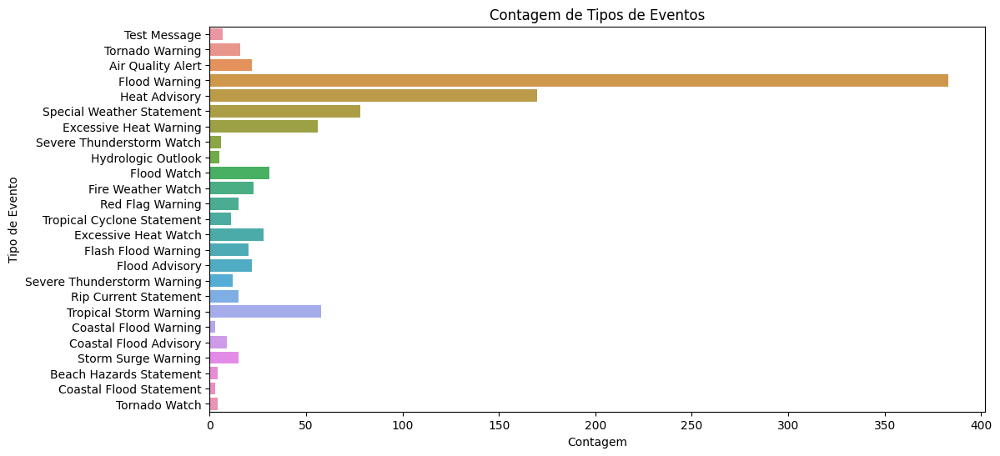

In [0]:
plt.figure(figsize=(12, 6))
sns.countplot(y='cap:event', data=pandas_df)
plt.title('Contagem de Tipos de Eventos')
plt.xlabel('Contagem')
plt.ylabel('Tipo de Evento')

In [0]:
# 1. Contagem por Estado (Plotly)
state_counts = pandas_df['state'].value_counts().reset_index()
state_counts.columns = ['Estado', 'Contagem']
fig1 = px.bar(state_counts, x='Estado', y='Contagem', 
              title='Contagem de Alertas por Estado',
              labels={'Contagem': 'Número de Alertas'})
fig1.show()

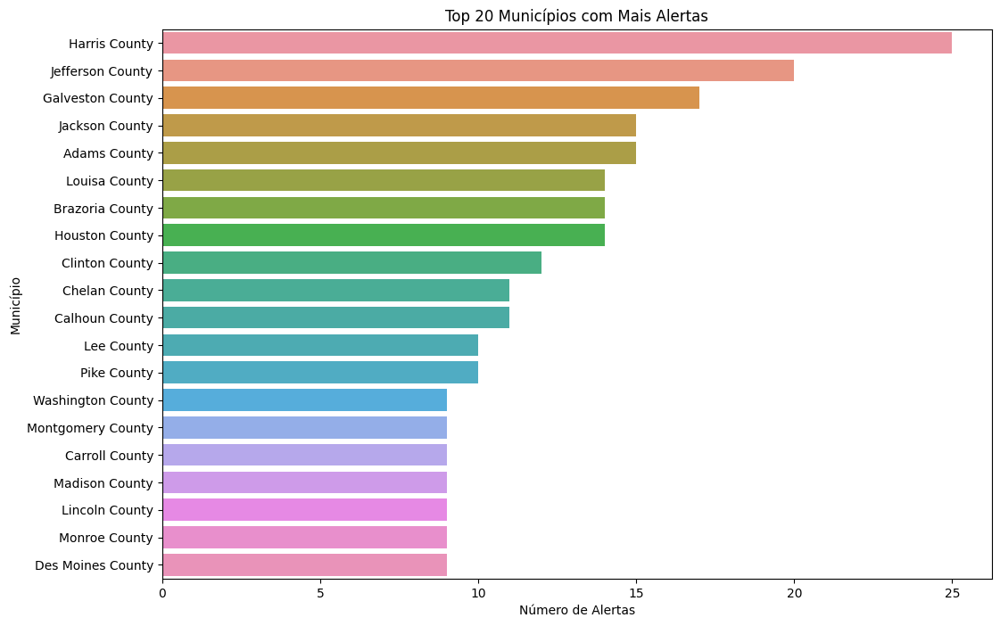

In [0]:
# 2. Top 20 Municípios com Mais Alertas (Seaborn)
municipality_counts = pandas_df['NAME'].value_counts().nlargest(20).reset_index()
municipality_counts.columns = ['Município', 'Contagem']
plt.figure(figsize=(12, 8))
sns.barplot(x='Contagem', y='Município', data=municipality_counts)
plt.title('Top 20 Municípios com Mais Alertas')
plt.xlabel('Número de Alertas')
plt.ylabel('Município')
plt.show()

In [0]:
from datetime import datetime

# Converter a coluna 'cap:effective' para datetime
pandas_df['cap:effective'] = pd.to_datetime(pandas_df['cap:effective'])

# Obter a data e hora atual
current_time = datetime.now()

# Filtrar alertas ativos
active_alerts = pandas_df[(pandas_df['cap:status'] == 'Actual') & (pandas_df['cap:effective'] <= current_time)]

# Contar alertas ativos por tipo de evento
active_alerts_count = active_alerts['cap:event'].value_counts().reset_index()
active_alerts_count.columns = ['Tipo de Alerta', 'Contagem']

# Criar gráfico de barras para alertas ativos
fig = px.bar(active_alerts_count, 
             x='Tipo de Alerta', 
             y='Contagem',
             title='Alertas Ativos por Tipo',
             labels={'Contagem': 'Número de Alertas Ativos'},
             color='Tipo de Alerta')

fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [0]:
# 4. Contagem por Tipo de Alerta (Plotly)
alert_type_counts = pandas_df['cap:event'].value_counts().reset_index()
alert_type_counts.columns = ['Tipo de Alerta', 'Contagem']
fig4 = px.pie(alert_type_counts, values='Contagem', names='Tipo de Alerta', 
              title='Distribuição de Tipos de Alerta')
fig4.show()

### Gráfico de pizza para mostrar a distribuição de severidade

Text(0.5, 1.0, 'Distribuição de Severidade')

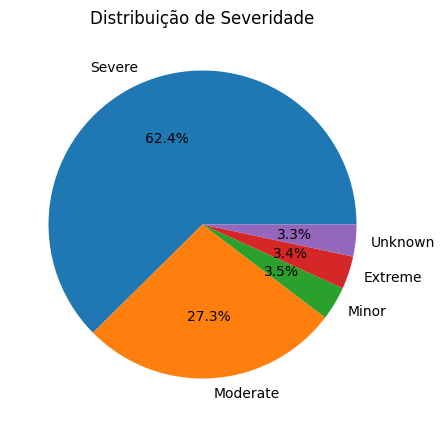

In [0]:
severity_counts = pandas_df['cap:severity'].value_counts()
plt.figure(figsize=(5, 5))
plt.pie(severity_counts.values, labels=severity_counts.index, autopct='%1.1f%%')
plt.title('Distribuição de Severidade')


### Gráfico de barras empilhadas para mostrar a relação entre urgência e status

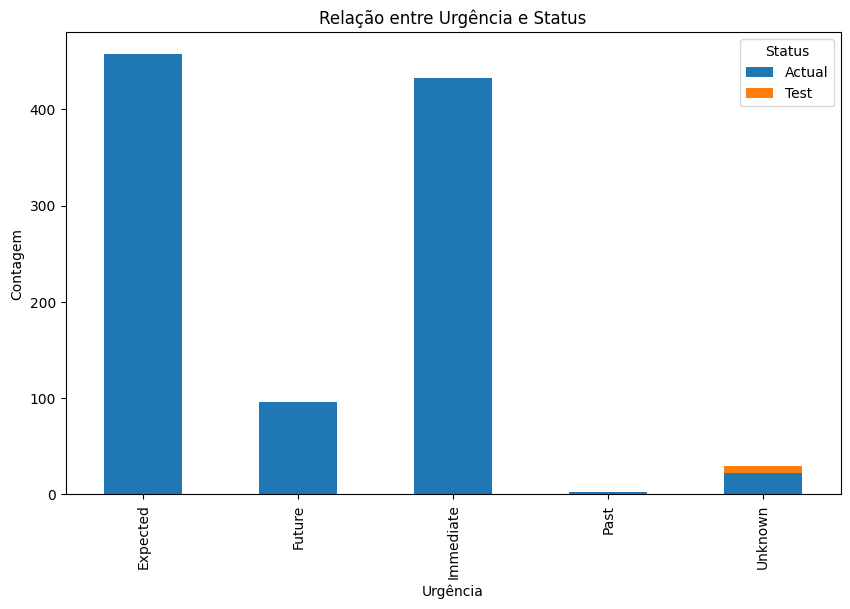

In [0]:
urgency_status = pandas_df.groupby(['cap:urgency', 'cap:status']).size().unstack()
urgency_status.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Relação entre Urgência e Status')
plt.xlabel('Urgência')
plt.ylabel('Contagem')
plt.legend(title='Status')

### Nuvem de palavras dos títulos

Text(0.5, 1.0, 'Nuvem de Palavras dos Títulos')

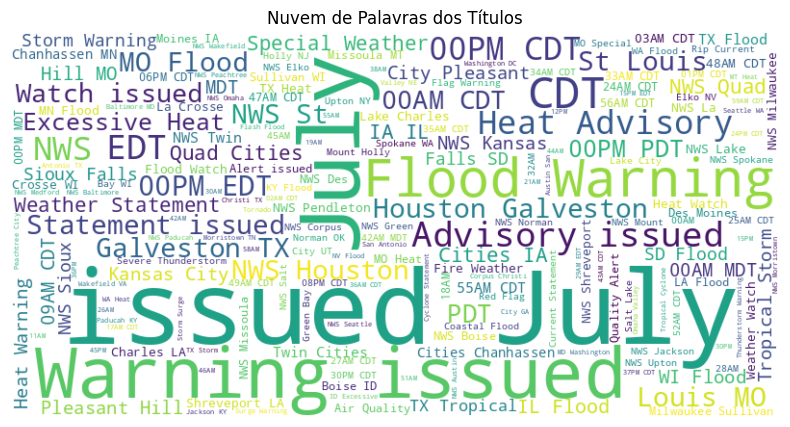

In [0]:
from wordcloud import WordCloud

text = ' '.join(pandas_df['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Nuvem de Palavras dos Títulos')

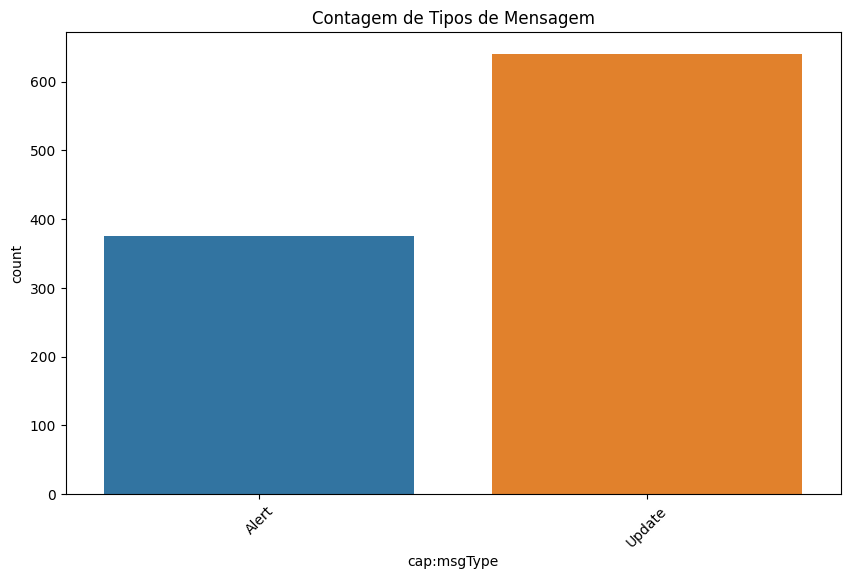

In [0]:
# 3. Seaborn: Gráfico de contagem para tipos de mensagem
plt.figure(figsize=(10, 6))
sns.countplot(x='cap:msgType', data=pandas_df)
plt.title('Contagem de Tipos de Mensagem')
plt.xticks(rotation=45)
plt.show()


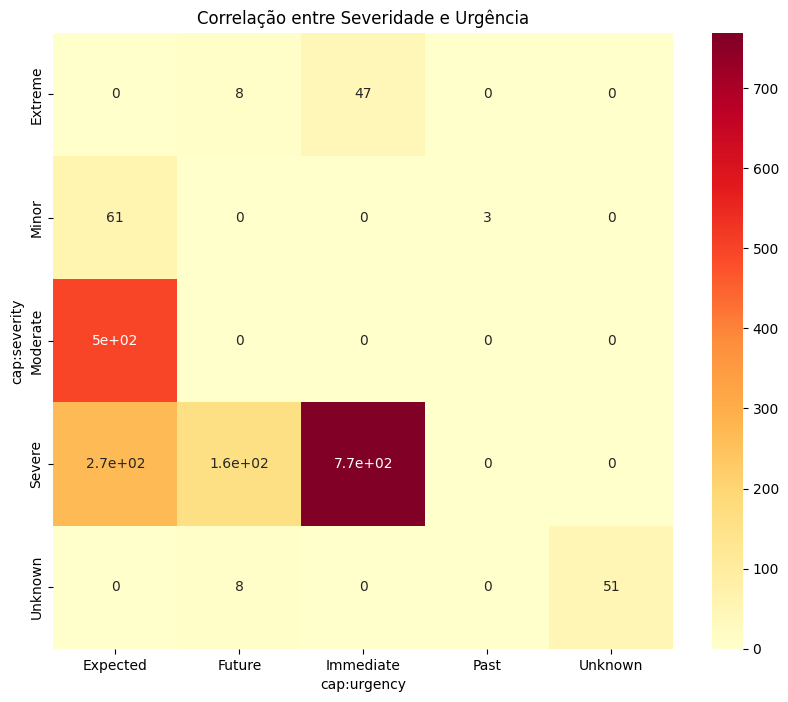

In [0]:
# 4. Seaborn: Gráfico de calor para correlação entre severidade e urgência
severity_urgency = pd.crosstab(pandas_df['cap:severity'], pandas_df['cap:urgency'])
plt.figure(figsize=(10, 8))
sns.heatmap(severity_urgency, annot=True, cmap='YlOrRd')
plt.title('Correlação entre Severidade e Urgência')
plt.show()

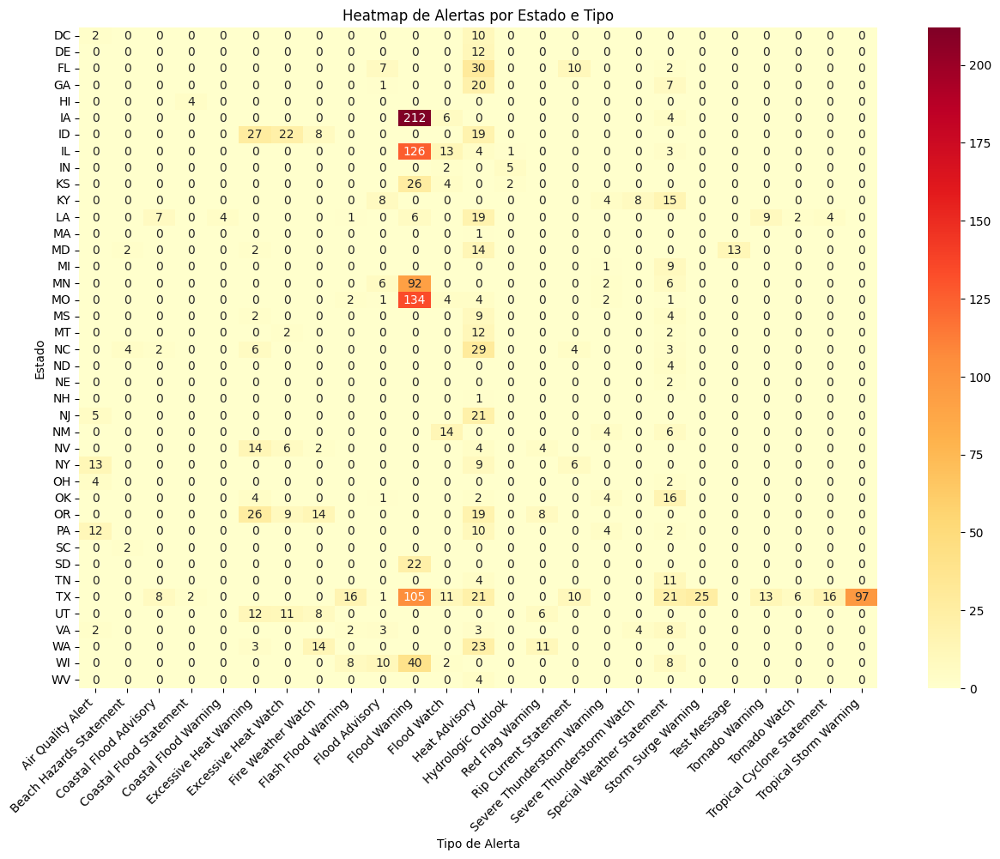

In [0]:
# 5. Heatmap de Alertas por Estado e Tipo (Seaborn)
state_event_cross = pd.crosstab(pandas_df['state'], pandas_df['cap:event'])
plt.figure(figsize=(15, 10))
sns.heatmap(state_event_cross, annot=True, fmt='d', cmap='YlOrRd')
plt.title('Heatmap de Alertas por Estado e Tipo')
plt.ylabel('Estado')
plt.xlabel('Tipo de Alerta')
plt.xticks(rotation=45, ha='right')
plt.show()